<h1>Assignment

In [ ]:
#importing libraries
import glob
from PIL import Image
import os
import numpy as np
import tensorflow as tf
from os import listdir
import cv2
from os.path import isfile, join
import matplotlib.pyplot as plt
from skimage import exposure
import helpscriptpy as hs 

%matplotlib inline


In [ ]:
# zipped folder are uploaded from local system and retained here for 12 hours using following library
from google.colab import files
uploaded = files.upload()

#this unzips tha images in the "dataset" folder
!unzip images -d dataset

Saving images.zip to images.zip
Archive:  images.zip
  inflating: dataset/01.jpg          
  inflating: dataset/02.jpg          
  inflating: dataset/03.png          
  inflating: dataset/04.jpg          
  inflating: dataset/05.jpeg         
  inflating: dataset/05.jpg          
  inflating: dataset/06.jpeg         
  inflating: dataset/07.jpg          
  inflating: dataset/08.jpg          


In [ ]:
image_signmagaus = []
image_signmasnp = []
imagetask4 = []
gaussnoisy_image =[]
snpnoisy_image =[]
image_medgaus = []
image_medsnp = []

In [ ]:
laplacian = np.array((
	[0, 1, 0],
	[1, -4, 1],
	[0, 1, 0]), dtype="int")
 
# Sobel x-axis kernel
sobelX = np.array((
	[-1, 0, 1],
	[-2, 0, 2],
	[-1, 0, 1]), dtype="int")
 
# Sobel y-axis kernel
sobelY = np.array((
	[-1, -2, -1],
	[0, 0, 0],
	[1, 2, 1]), dtype="int")

Guassian = np.array([[1/16,2/16,1/16],
                     [2/16,4/16,2/16],
                     [1/16,2/16,1/16]])

#defining box filter kernel to smooth the image, the calculation will be divided by 1/9 
Box = np.array([[1/9,1/9,1/9],
                [1/9,1/9,1/9],
                [1/9,1/9,1/9]])

#defining sharp filter kernel (lapacian)
Sharp = np.array([[0,-1,0],
                  [-1,5,-1],
                  [0,-1,0]])

<h2> Task 2.1 <br>
<h3>Load the set of images and display them as Grayscale and rgb images. You are required to show these images ”inline” rather than creating a new window for every other image.


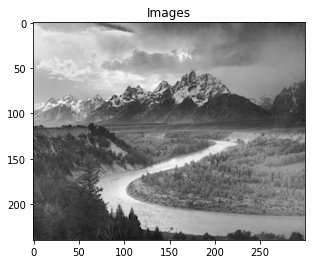

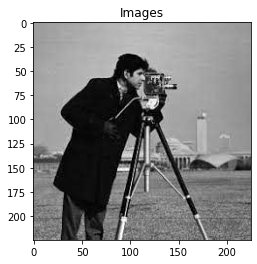

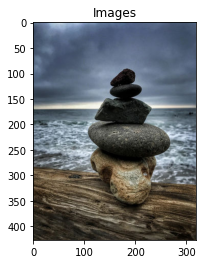

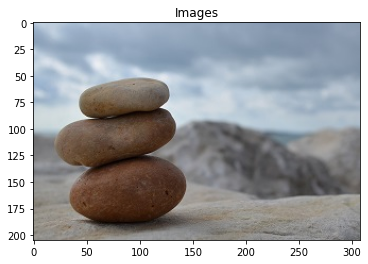

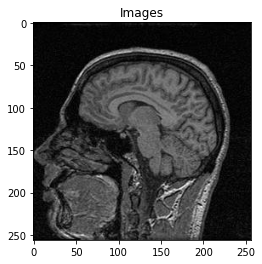

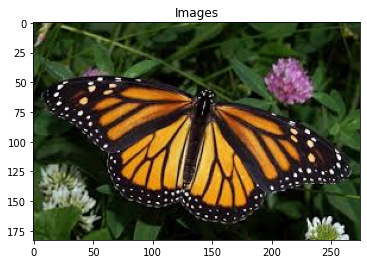

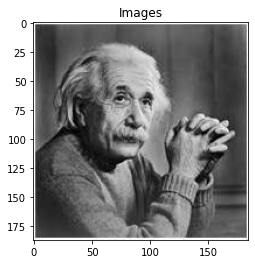

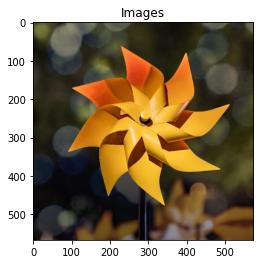

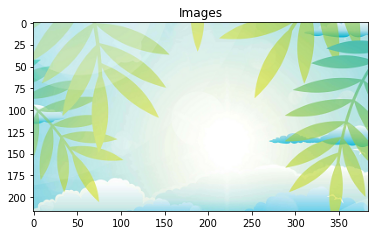

In [ ]:
#loading and displaying images in its original format, from dataset folder to "images" array 
images = hs.load_data("dataset/")
hs.displayImageArray(images, 'Images')

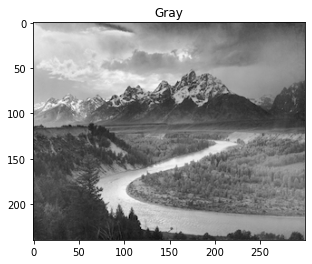

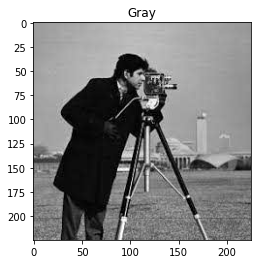

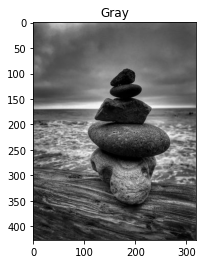

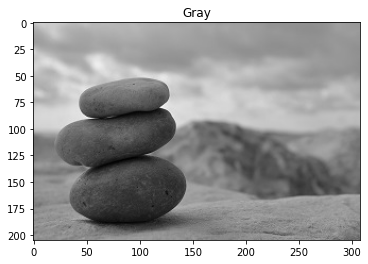

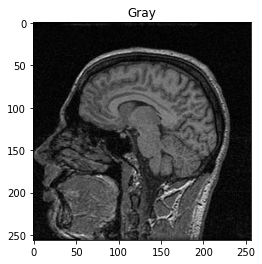

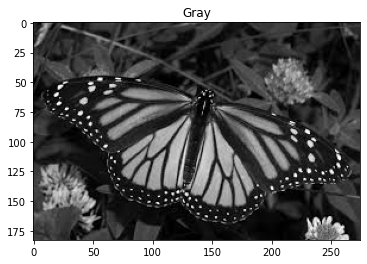

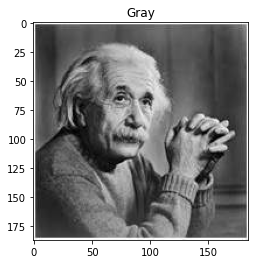

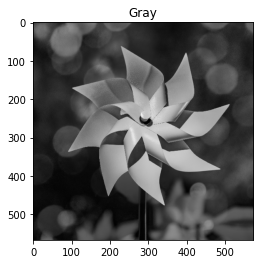

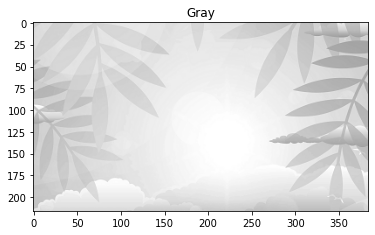

In [ ]:
#loading and displaying images as Gray Scale, from dataset folder to "imagesGrayScale" array 
imagesGrayScale = hs.load_data_astype("dataset/", 0)
hs.displayImageArray(imagesGrayScale, 'Gray')

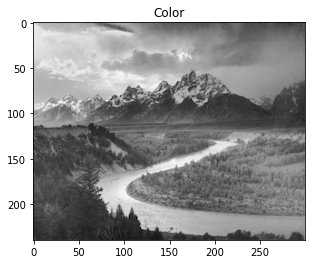

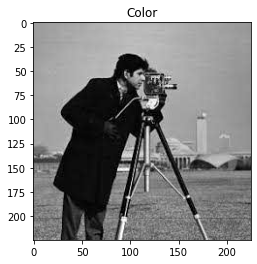

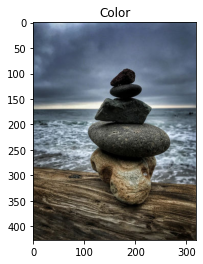

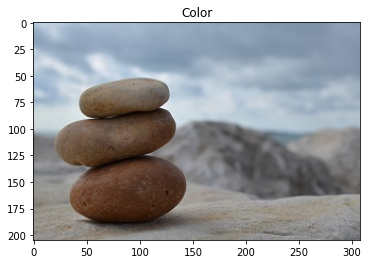

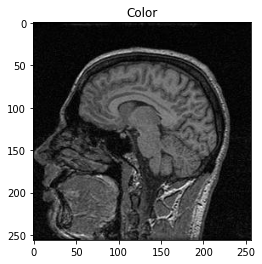

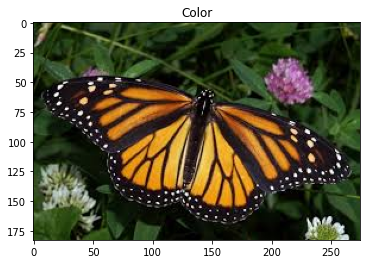

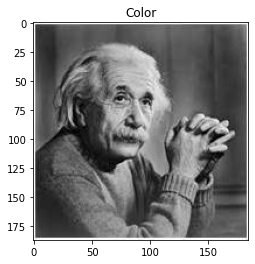

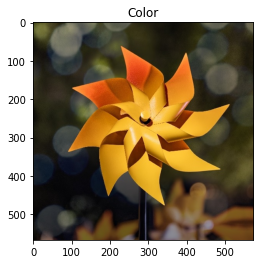

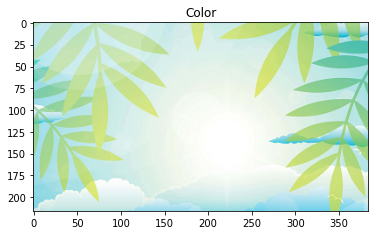

In [ ]:
#loading and displaying images as Color, from dataset folder to "imagesColored" array 
imagesColored = hs.load_data_astype("dataset/", 1)
hs.displayImageArray(imagesColored, 'Color')

<h2> Task 2.2 <br>
<h3>Implement the function rgbExclusion() in the helper script, in which the input image is decomposed into the three channels: R, G and B and return the image excluding the specified channel. Display the results in notebook.

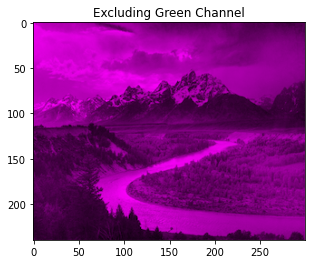

In [ ]:
hs.rgbExclusion(imagesColored[0], 'green')

<h2>Task 2.3<br>
<h3>Take at-least 3 images from given set and plot histograms before and after applying histogram equalization. Show these image inline format i.e. grayscale image –> display histogram –> apply histogram
equalization–> display the equalized image and its histogram. 

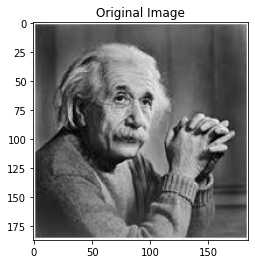

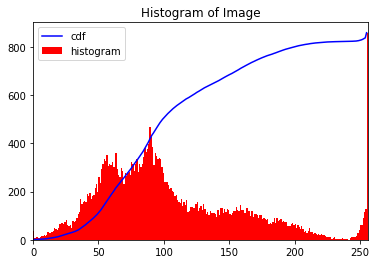

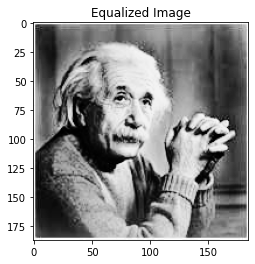

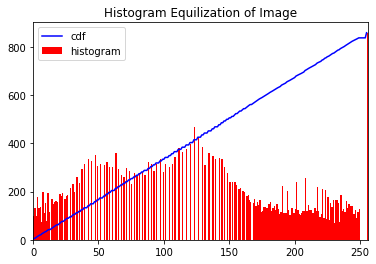

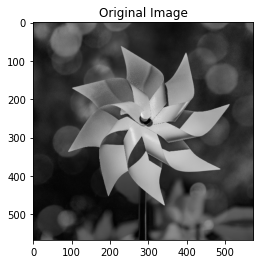

...

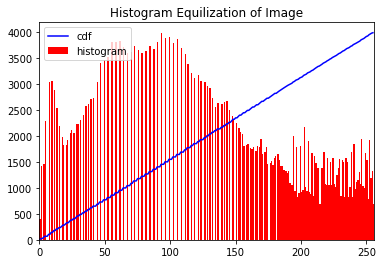

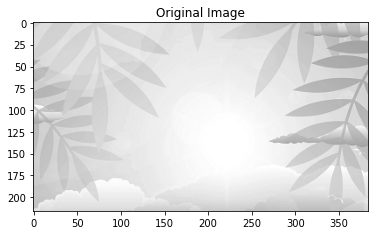

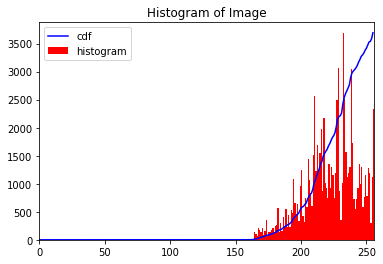

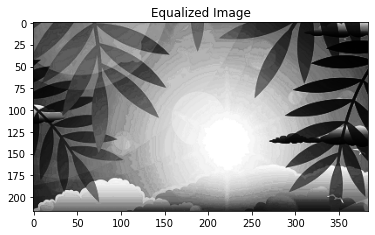

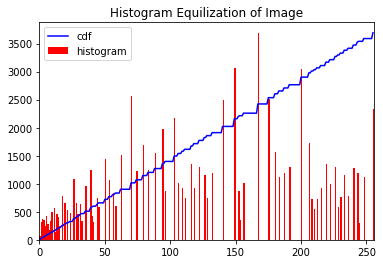

In [ ]:
for i in range(6, 9):
  hs.displayImage(imagesGrayScale[i], 'Original Image')
  hs.plotHistogram(imagesGrayScale[i], 0)
  imageequ=hs.histogramEquilization(imagesGrayScale[i])
  hs.displayImage(imageequ, 'Equalized Image')
  hs.plotHistogram(imageequ, 1)


<h2> Task 2.4 <br>
<h3>You are required to implement the convolution operation from scratch. This function which takes an image and a kernel and returns the convolution of them. Compare the results of your implemented function with the ones available (built-in) in python packages. You are required to convolve images for sharpening and blurring effects.

Text(0.5, 1.0, 'Sharp Image')

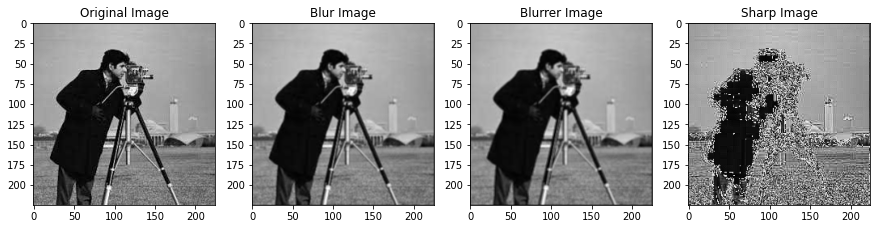

In [ ]:

# Convolution from scratch for Blur Image using Guassian filter, 
# more blur image using Box filter and Sharp image using kernel whose
# coefficient sharpens image
# Note: all kernels are defined above
imagetask4.append(hs.Convolve2dfromScratch(imagesGrayScale[1],Guassian, 'blur'))
imagetask4.append(hs.Convolve2dfromScratch(imagesGrayScale[1],Box, 'blurrer'))
imagetask4.append(hs.Convolve2dfromScratch(imagesGrayScale[1],Sharp, 'sharp'))

 
#Plotting all results of convolution from scratch
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15,15))
ax1.imshow(imagesGrayScale[1], cmap=plt.cm.gray)
ax1.set_title('Original Image')
ax2.imshow(imagetask4[0], cmap=plt.cm.gray)
ax2.set_title('Blur Image')
ax3.imshow(imagetask4[1], cmap=plt.cm.gray)
ax3.set_title('Blurrer Image')
ax4.imshow(imagetask4[2], cmap=plt.cm.gray)
ax4.set_title('Sharp Image')

Text(0.5, 1.0, 'Sharp Image clip at 0.09')

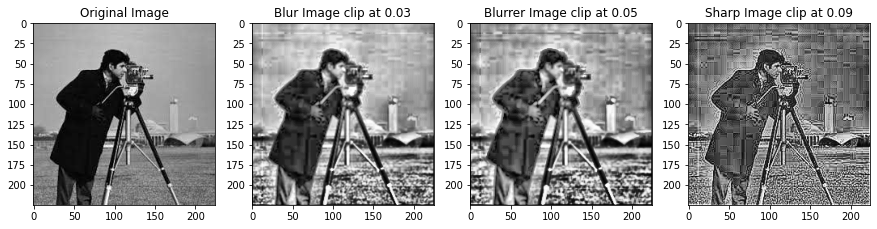

In [ ]:
# Convolution using library function 
sinalimage_blur = hs.Convolve2dUsingLibrary(imagesGrayScale[1],Guassian, 'same')
# Adjust the contrast of the filtered image by applying Histogram Equalization 
imagetask4.append(exposure.equalize_adapthist(sinalimage_blur/np.max(np.abs(sinalimage_blur)), clip_limit=0.03))

sinalimage_blurrer = hs.Convolve2dUsingLibrary(imagesGrayScale[1],Box, 'same')
# Adjust the contrast of the filtered image by applying Histogram Equalization 
imagetask4.append(exposure.equalize_adapthist(sinalimage_blurrer/np.max(np.abs(sinalimage_blurrer)), clip_limit=0.05))

sinalimage_sharp = hs.Convolve2dUsingLibrary(imagesGrayScale[1],Sharp, 'same')
# Adjust the contrast of the filtered image by applying Histogram Equalization 
imagetask4.append(exposure.equalize_adapthist(sinalimage_sharp/np.max(np.abs(sinalimage_sharp)), clip_limit=0.09))

#Plotting all results of convolution using library
fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(15,15))
ax0.imshow(imagesGrayScale[1], cmap=plt.cm.gray)
ax0.set_title('Original Image')
ax1.imshow(imagetask4[3], cmap=plt.cm.gray)
ax1.set_title('Blur Image clip at 0.03')
ax2.imshow(imagetask4[4], cmap=plt.cm.gray)
ax2.set_title('Blurrer Image clip at 0.05')
ax3.imshow(imagetask4[5], cmap=plt.cm.gray)
ax3.set_title('Sharp Image clip at 0.09')


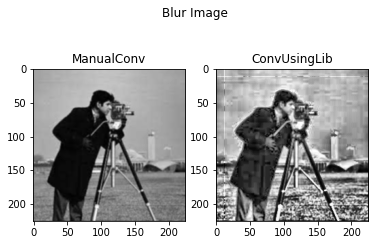

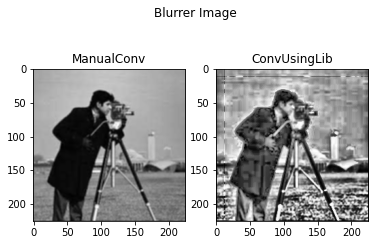

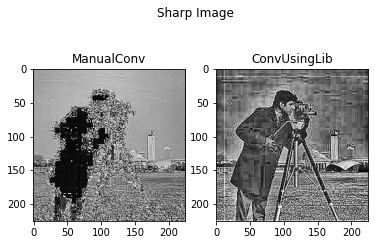

In [ ]:
#Comparing results of convolution using library and from scratch (manual)
hs.displayComaprisonConvolution(imagetask4)

<h2> Task 2.5 <br>
<h3>Load a couple of images from the given set. <br>
1. Apply box filter using convolution, and display the resultant image

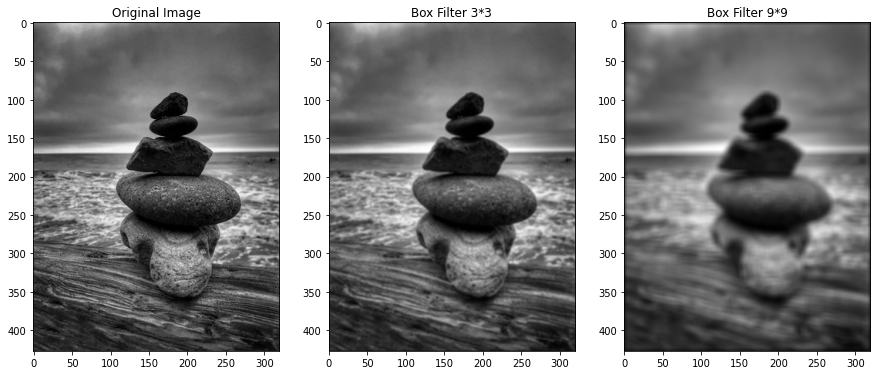

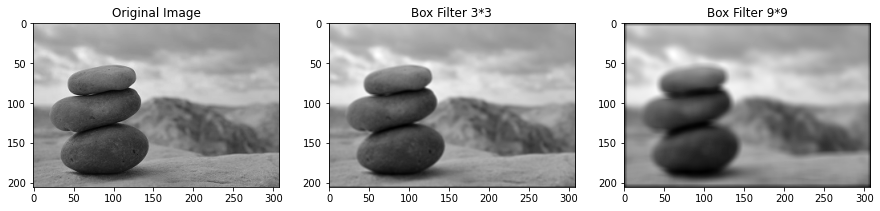

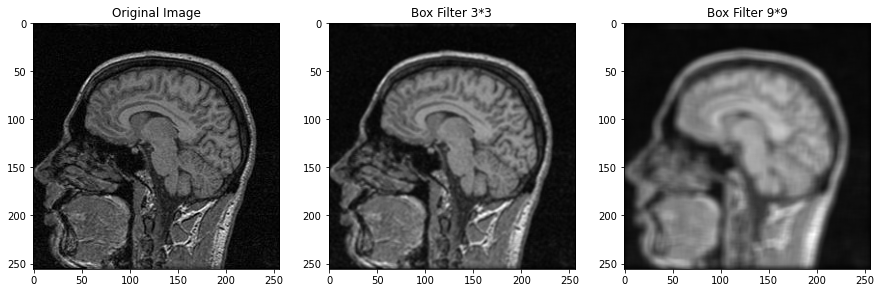

In [ ]:
for i in range(2, 5):
  #Box filter with kernel size 3
  image_blurbox3 = hs.BoxFilter(imagesGrayScale[i], 3)

  #Box filter with kernel size 9
  image_blurbox9 = hs.BoxFilter(imagesGrayScale[i], 9)

  #Plotting results of box filter
  fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15,15))
  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(image_blurbox3, cmap=plt.cm.gray)
  ax1.set_title('Box Filter 3*3')
  ax2.imshow(image_blurbox9, cmap=plt.cm.gray)
  ax2.set_title('Box Filter 9*9')

<h3>2. Apply Gaussian filter to the image, with varying sigma values.

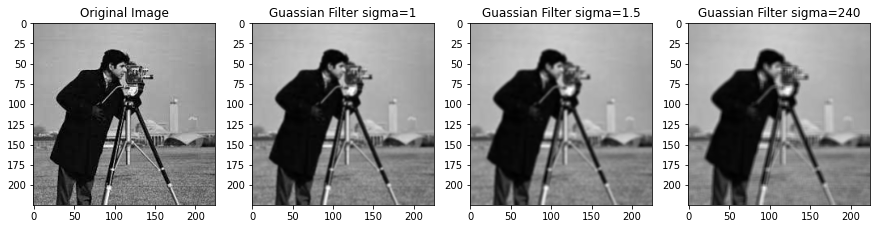

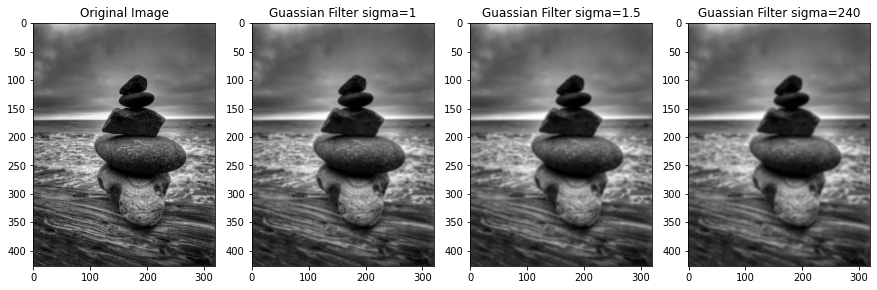

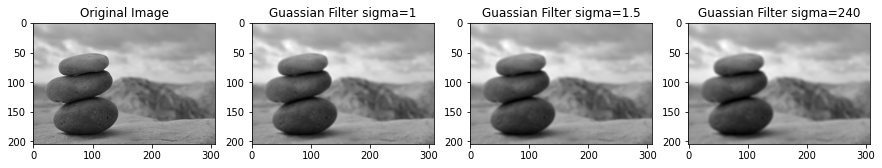

In [ ]:
for i in range(1, 4):
  #Guassian filter with sigma 1
  image_blursigma1 = hs.GuassianFilter(imagesGrayScale[i], 1)
  #Guassian filter with sigma 1.5
  image_blursigma15 = hs.GuassianFilter(imagesGrayScale[i], 1.5)
  #Guassian filter with sigma 240
  image_blursigma240 = hs.GuassianFilter(imagesGrayScale[i], 240)

  #Plotting results of guassian filter with varying sigma
  fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(15,15))
  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(image_blursigma1, cmap=plt.cm.gray)
  ax1.set_title('Guassian Filter sigma=1')
  ax2.imshow(image_blursigma15, cmap=plt.cm.gray)
  ax2.set_title('Guassian Filter sigma=1.5')
  ax3.imshow(image_blursigma240, cmap=plt.cm.gray)
  ax3.set_title('Guassian Filter sigma=240')

<h3> 3. Add Gausian Noise and Salt and Pepper Noise to them.


/content/helpscriptpy.py:186: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 1
/content/helpscriptpy.py:192: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


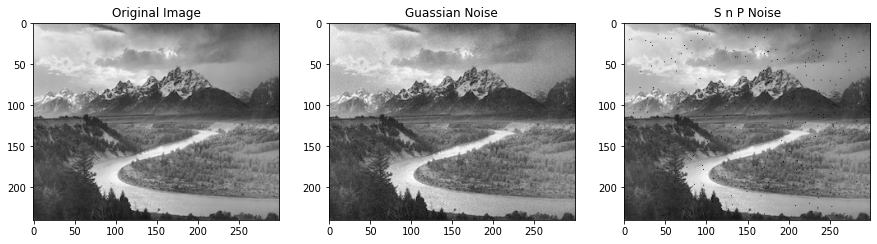

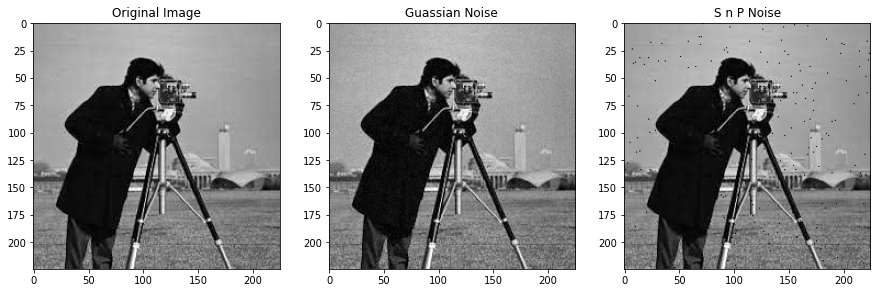

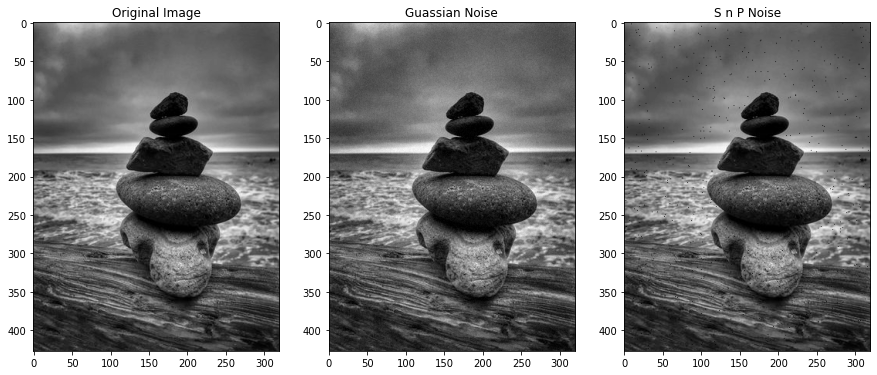

In [ ]:
j=0
for i in range(0, 3):

  #Adding guassian noise
  gaussnoisy_image.append(hs.Noisy("gauss",imagesGrayScale[i]))

  #Adding salt and pepper noise
  snpnoisy_image.append(hs.Noisy("s&p",imagesGrayScale[i]))

  #plotting results of guassian and salt and pepper noise
  fig, (ax0, ax1,ax2) = plt.subplots(1, 3, figsize=(15,15))
  fig.subplots_adjust(top=0.88)

  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(gaussnoisy_image[j], cmap=plt.cm.gray)
  ax1.set_title('Guassian Noise')
  ax2.imshow(snpnoisy_image[j], cmap=plt.cm.gray)
  ax2.set_title('S n P Noise')
  j=j+1

<h3>4. Apply Gaussian Filter and Median Filters.


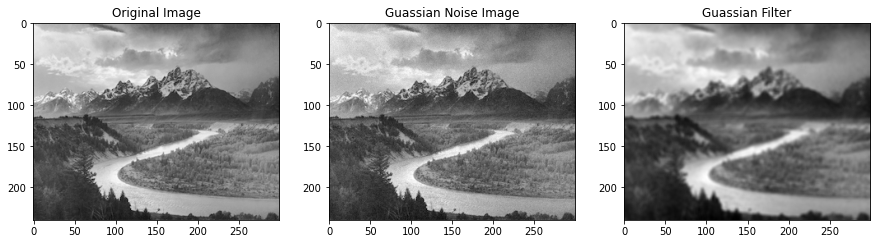

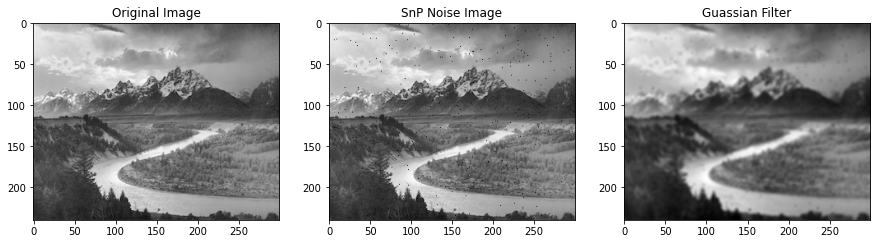

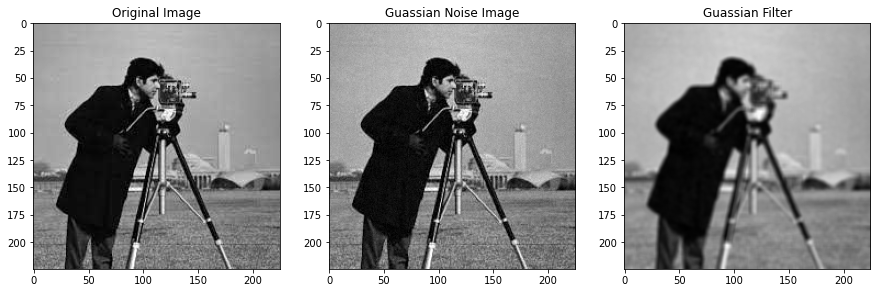

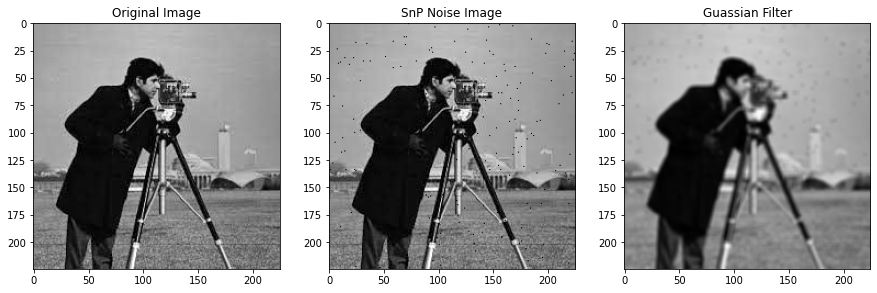

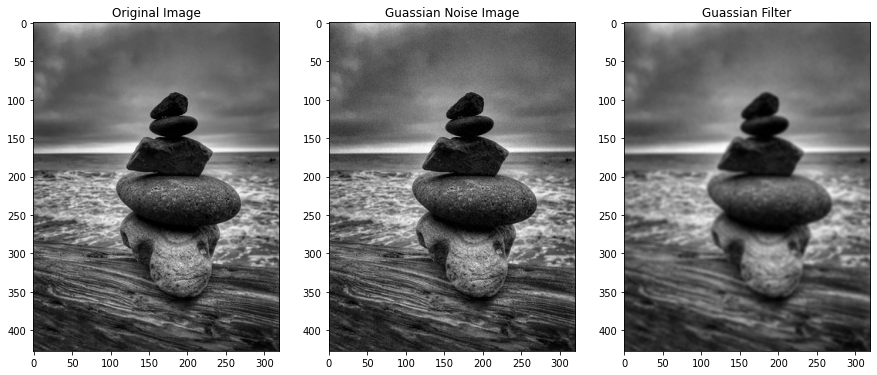

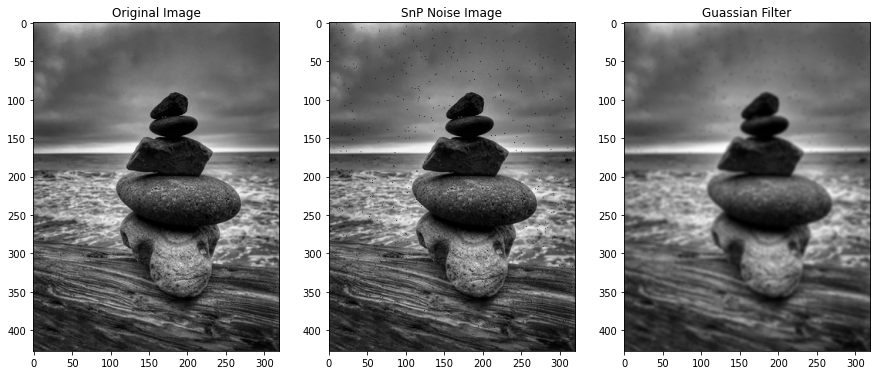

In [ ]:

for i in range(0,3):
  #Applying guassian filter on guassian noise
  image_signmagaus.append(hs.GuassianFilter(gaussnoisy_image[i], 2))
  #Applying guassian filter on SnP noise
  image_signmasnp.append(hs.GuassianFilter(snpnoisy_image[i],2 ))
  
  #plotting results of guassian filter on noises
  fig, (ax0, ax1,ax2) = plt.subplots(1, 3, figsize=(15,15))
  fig.subplots_adjust(top=0.88)

  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(gaussnoisy_image[i], cmap=plt.cm.gray)
  ax1.set_title('Guassian Noise Image')
  ax2.imshow(image_signmagaus[i], cmap=plt.cm.gray)
  ax2.set_title('Guassian Filter')
  fig, (ax0, ax1,ax2) = plt.subplots(1, 3, figsize=(15,15))
  fig.subplots_adjust(top=0.88)

  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(snpnoisy_image[i], cmap=plt.cm.gray)
  ax1.set_title('SnP Noise Image')
  ax2.imshow(image_signmasnp[i], cmap=plt.cm.gray)
  ax2.set_title('Guassian Filter')
  



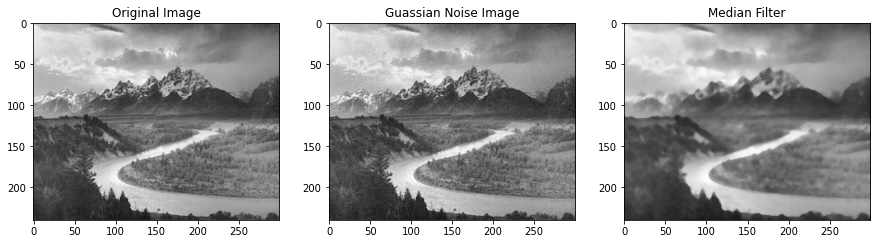

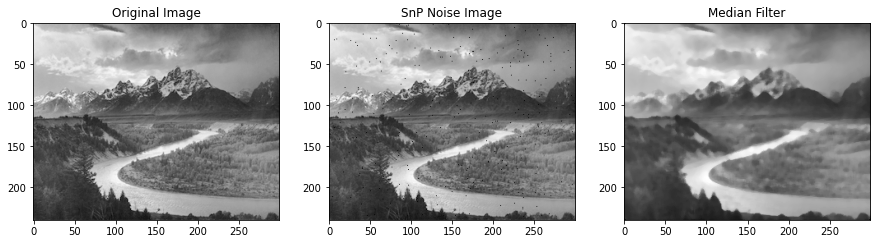

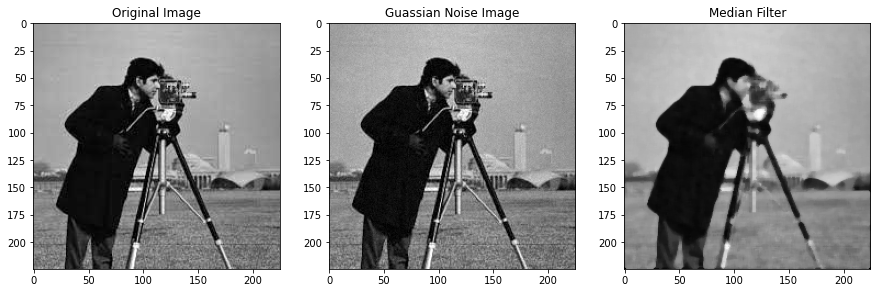

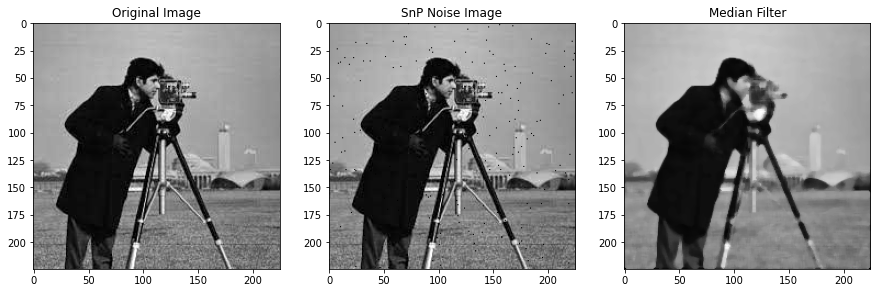

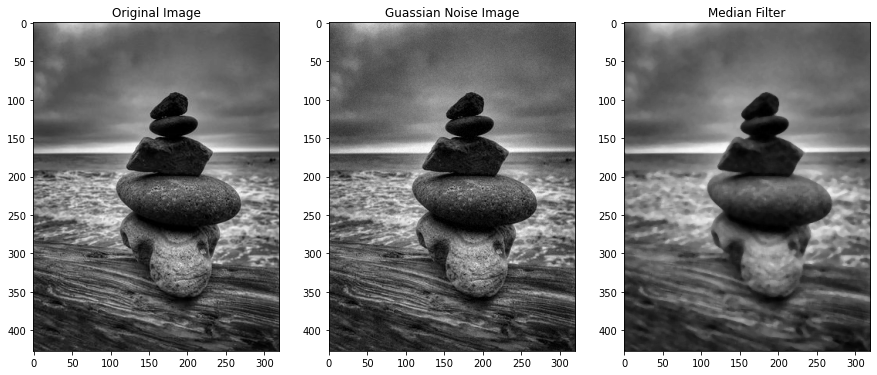

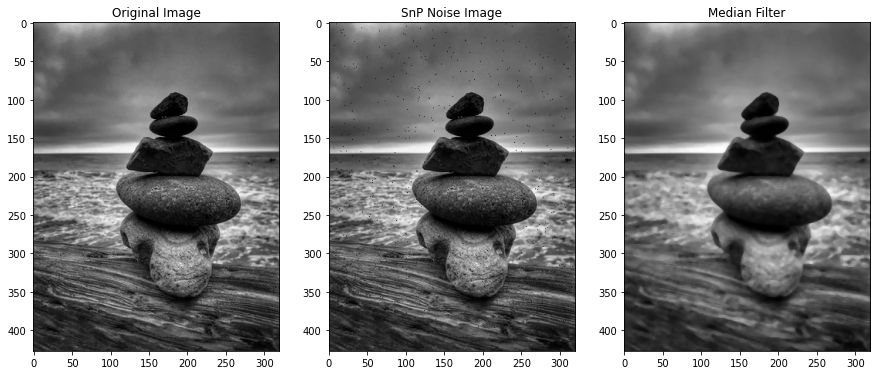

In [ ]:

for i in range(0,3):
  #Applying median filter on guassian noise
  image_medgaus.append(hs.MedianFilter(gaussnoisy_image[i]))
  #Applying median filter on snp noise
  image_medsnp.append(hs.MedianFilter(snpnoisy_image[i]))
  
  
  #plotting results of median filter on noises
  fig, (ax0, ax1,ax2) = plt.subplots(1, 3, figsize=(15,15))
  fig.subplots_adjust(top=0.88)

  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(gaussnoisy_image[i], cmap=plt.cm.gray)
  ax1.set_title('Guassian Noise Image')
  ax2.imshow(image_medgaus[i], cmap=plt.cm.gray)
  ax2.set_title('Median Filter')
  fig, (ax0, ax1,ax2) = plt.subplots(1, 3, figsize=(15,15))
  fig.subplots_adjust(top=0.88)

  ax0.imshow(imagesGrayScale[i], cmap=plt.cm.gray)
  ax0.set_title('Original Image')
  ax1.imshow(snpnoisy_image[i], cmap=plt.cm.gray)
  ax1.set_title('SnP Noise Image')
  ax2.imshow(image_medsnp[i], cmap=plt.cm.gray)
  ax2.set_title('Median Filter') 



Text(0.5, 1.0, 'Median Filter on S n P Noise')

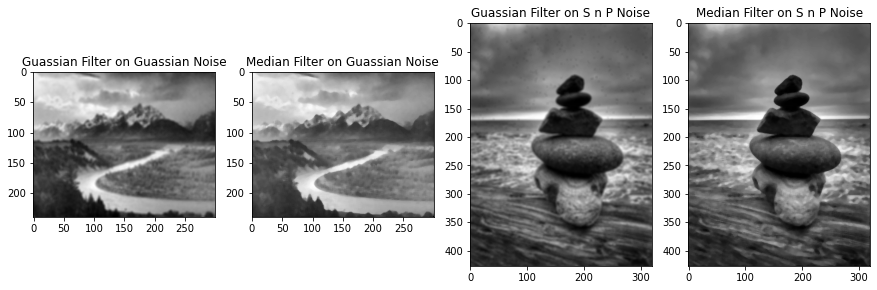

In [ ]:
#comparison of performance of guassian filter and median filter on guassian and snp noise
fig, (ax0, ax1,ax2, ax3) = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(top=0.88)
ax0.imshow(image_signmagaus[0], cmap=plt.cm.gray)
ax0.set_title('Guassian Filter on Guassian Noise')
ax1.imshow(image_medgaus[0], cmap=plt.cm.gray)
ax1.set_title('Median Filter on Guassian Noise')
ax2.imshow(image_signmasnp[2], cmap=plt.cm.gray)
ax2.set_title('Guassian Filter on S n P Noise')
ax3.imshow(image_medsnp[2], cmap=plt.cm.gray)
ax3.set_title('Median Filter on S n P Noise')

<h3>5: Display mesh plots for different <br>i) Gaussian filters, ii) First Order Derivative of Gaussian, iii)
Laplacian of Gaussian; using different sigma values


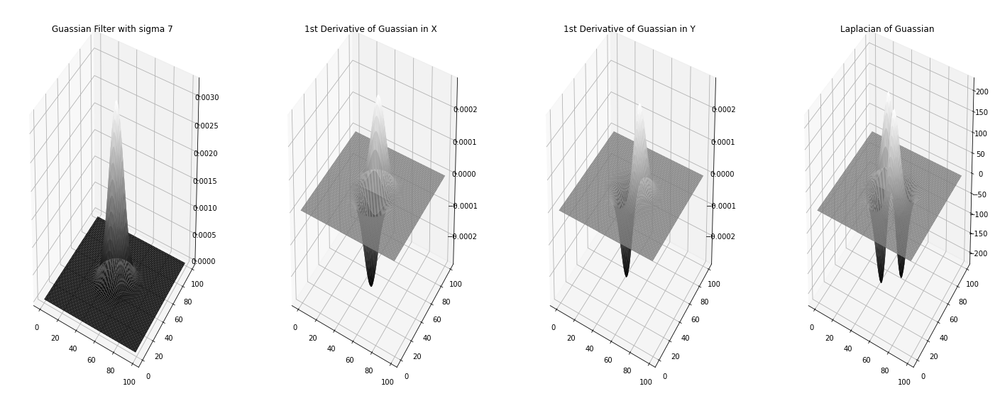

In [ ]:
# using sigma =7
low_sigma = cv2.GaussianBlur(imagesGrayScale[8],(3,3),1)
high_sigma = cv2.GaussianBlur(imagesGrayScale[8],(5,5),8)
 
# Calculate the DoG by subtracting
image = low_sigma - high_sigma
img = cv2.resize(image,(100,100))
sigma = 7
N = 100
half_N = N // 2
x, y = np.mgrid[0:img.shape[0], 0:img.shape[1]]

z = -hs.guassian(x - half_N, y - half_N, sigma)

# # create the figure
fig = plt.figure(figsize=(25,10))
ax = fig.add_subplot(1, 4, 1, projection='3d')
ax.set_title(r'Guassian Filter with sigma 7',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)


z = -hs.first_dev_guassian_y(x - half_N, y - half_N, sigma)
ax = fig.add_subplot(1, 4, 2, projection='3d')
ax.set_title(r'1st Derivative of Guassian in X',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)


z = -hs.first_dev_guassian_x(x - half_N, y - half_N, sigma)
ax = fig.add_subplot(1, 4, 3, projection='3d')
ax.set_title(r'1st Derivative of Guassian in Y',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)


z = -hs.second_dev_guassian(x - half_N, y - half_N, sigma)
ax = fig.add_subplot(1, 4, 4, projection='3d')
ax.set_title(r'Laplacian of Guassian',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)

plt.show()



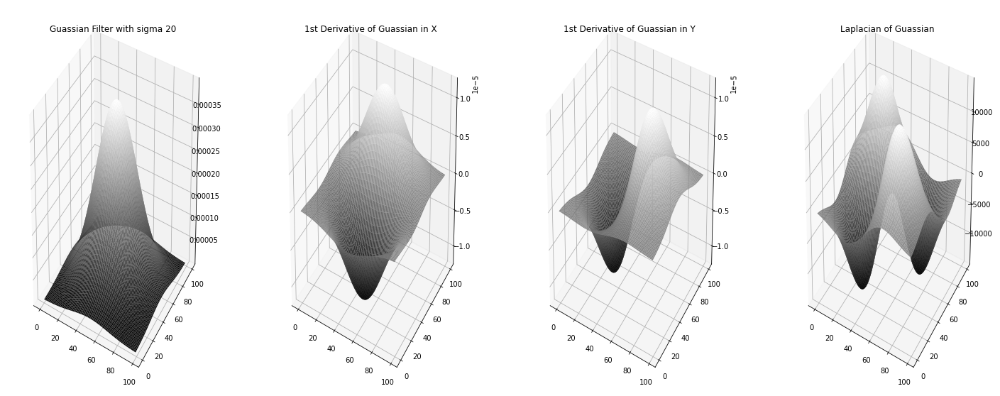

In [ ]:
# using sigma =20
sigma = 20
low_sigma = cv2.GaussianBlur(imagesGrayScale[8],(3,3),1)
high_sigma = cv2.GaussianBlur(imagesGrayScale[8],(5,5),8)
 
# Calculate the DoG by subtracting
image = low_sigma - high_sigma
img = cv2.resize(image,(100,100))
N = 100
half_N = N // 2
x, y = np.mgrid[0:img.shape[0], 0:img.shape[1]]

z = -hs.guassian(x - half_N, y - half_N, sigma)

# # create the figure
fig = plt.figure(figsize=(25,10))
ax = fig.add_subplot(1, 4, 1, projection='3d')
ax.set_title(r'Guassian Filter with sigma 20',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)

z = -hs.first_dev_guassian_y(x - half_N, y - half_N, sigma)
ax = fig.add_subplot(1, 4, 2, projection='3d')
ax.set_title(r'1st Derivative of Guassian in X',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)


z = -hs.first_dev_guassian_x(x - half_N, y - half_N, sigma)
ax = fig.add_subplot(1, 4, 3, projection='3d')
ax.set_title(r'1st Derivative of Guassian in Y',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)


z = -hs.second_dev_guassian(x - half_N, y - half_N, sigma)
ax = fig.add_subplot(1, 4, 4, projection='3d')
ax.set_title(r'Laplacian of Guassian',fontsize=12, color='k')
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, z,rstride=1, cstride=1, cmap=plt.cm.gray,
        linewidth=0)
plt.show()



<h2> Task 2.6 <br>
<h3>Load a few images from the given set.<br>
1. Apply Sobel operator, computer gradient magnitude and display the results (original image, gradient images and gradient magnitude image).


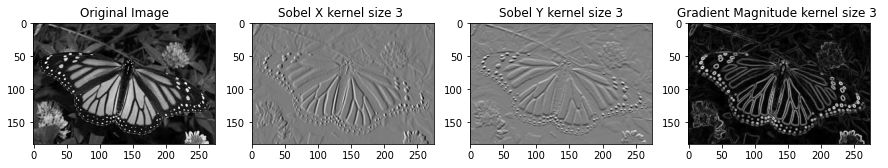

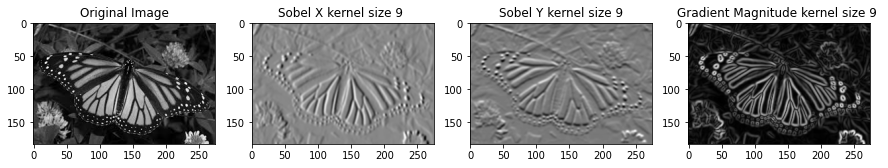

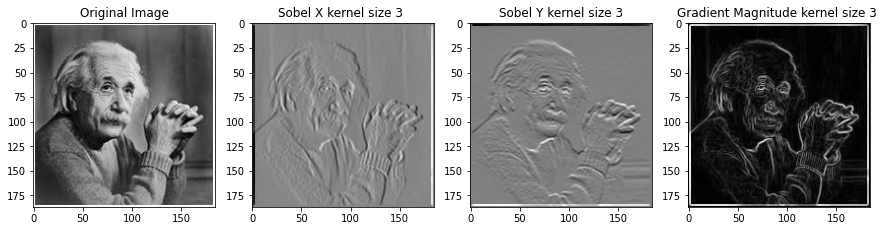

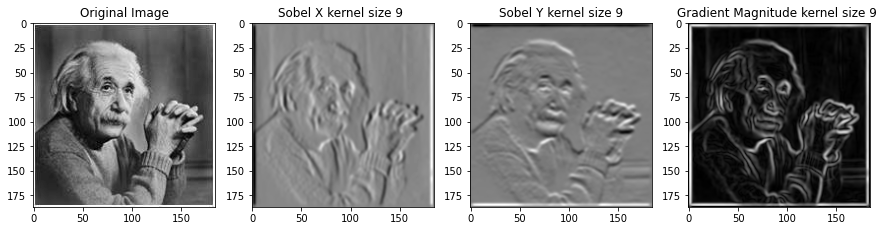

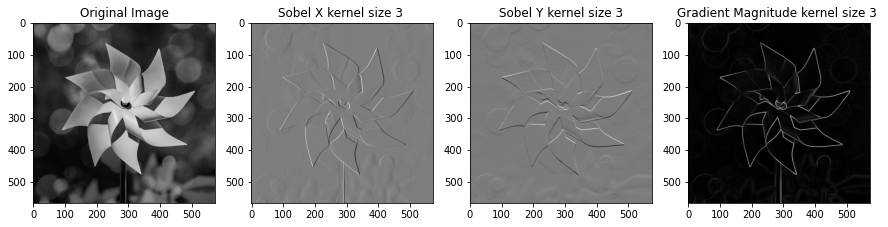

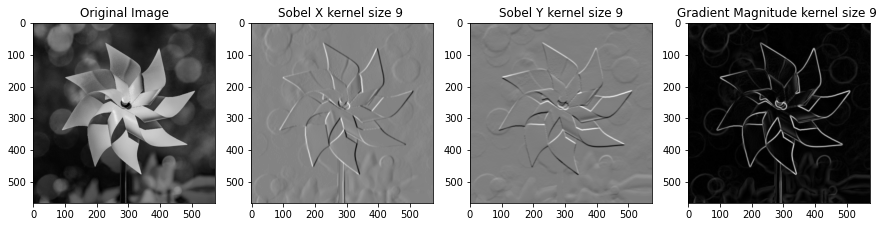

In [ ]:
for i in range(5,8):
  #Applying Sobel Operator with kernel size 3
  #plotting results as
  # 1)Original Image 2)Sobel in X direction 3) Sobel in Y direction 4) Gradient Magnitude
  image_sobel = hs.SobelOperator(imagesGrayScale[i], i, 3)

  #Applying Sobel Operator with kernel size 9
  image_sobel = hs.SobelOperator(imagesGrayScale[i], i, 9)


<h3>2. Apply Laplacian of Gaussian, computer laplacian magnitude and display the results (original image, filtered images and laplacian magnitude image). Try different filter kernel coefficients.


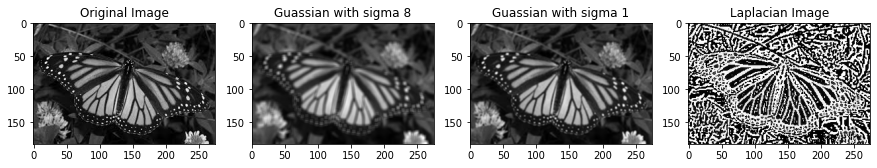

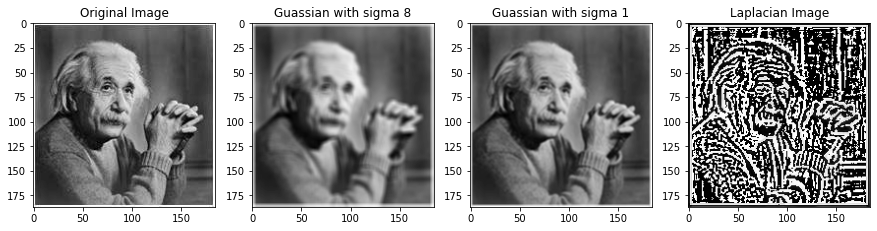

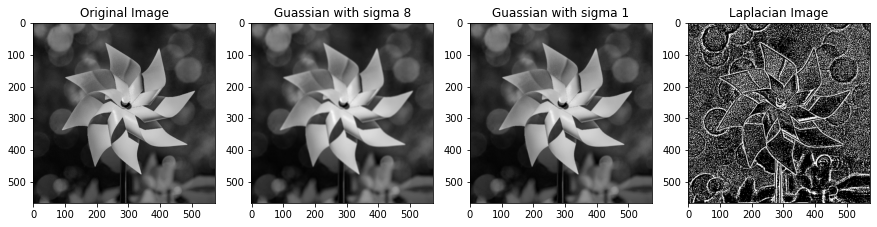

In [ ]:
image_laplacian = 0
for i in range(5,8):
  #Applying laplacian guassian
  image_laplacian = hs.Laplacian(imagesGrayScale[i], i)


<h3>3. Apply Canny Edge Detector and display the results.


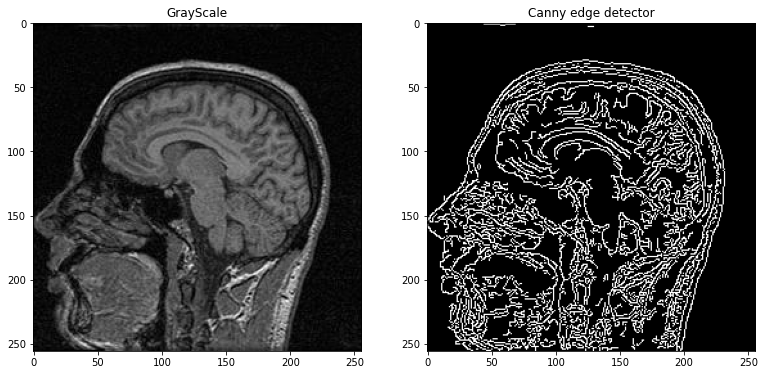

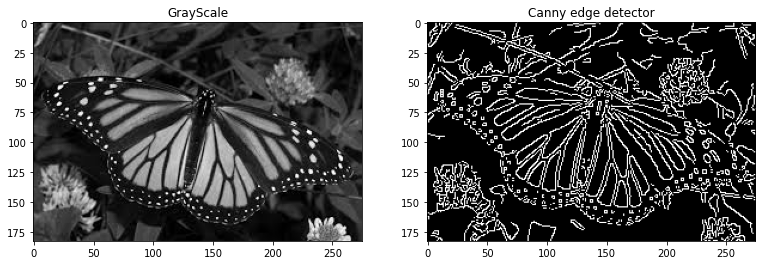

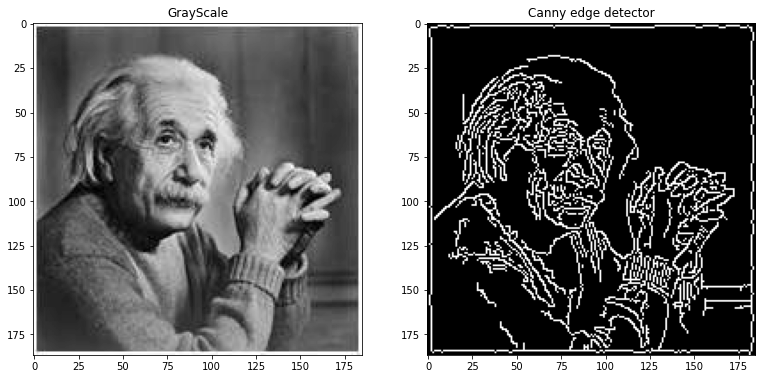

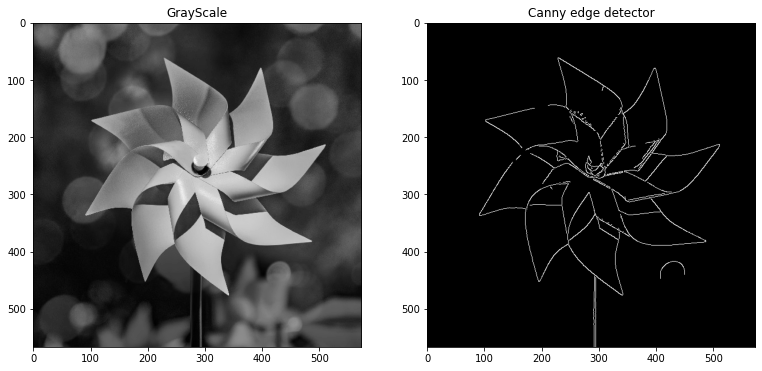

In [ ]:

for i in range(4,8):
  #Applying canny edge detector and plotting result
  image_canny = hs.CannyEdgeDetector(imagesGrayScale[i])